# StyleGAN-NADA Experiments in Colab
In this notebook, we will conduct a series of experiments with different methods of freezing generator layers in StyleGAN-NADA, and also test the selection of source text for better stylization.

---

### 1. Required downloads

In [ ]:
# Cloning StyleGAN-NADA repository
!git clone https://github.com/uko3/StyleGAN-nada.git
# Installing required libraries
!pip install Ninja
!pip install git+https://github.com/openai/CLIP.git -q
%cd StyleGAN-nada

Cloning into 'StyleGAN-nada'...
remote: Enumerating objects: 378, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 378 (delta 15), reused 20 (delta 7), pack-reused 348 (from 1)
Receiving objects: 100% (378/378), 43.08 MiB | 15.21 MiB/s, done.
Resolving deltas: 100% (207/207), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 11.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/21

### Importing required libraries

In [ ]:
# Importing modules
import torch
import torch.optim as optim
from torchvision.utils import save_image
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import copy
import re
import warnings
import clip
import csv

# Importing custom modules
from modules.stylegan_arch.model import Generator
from modules.losses import CLIPLoss, CLIPDirectionalLoss
from modules.trainer import LatentStyleTrainer
from modules.utils import generate_visualize_and_save # Import freeze_layers_adaptive directly
from modules.freeze_layers import freeze_layers_adaptive, freeze_layers,freeze_layers_adaptive_fine_grained, freeze_layers_adaptive_fine_tune  # Import freeze_layers_adaptive directly

# Selecting device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Используется устройство: {device}")
seeds = (92126, 773, 779, 373, 2112)

/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Используется устройство: cuda


### Downloading the pretrained StyleGAN2 weights

In [ ]:
# Downloading pretrained StyleGAN2 model
if not os.path.exists('stylegan2-ffhq-config-f.pt'):
    !gdown https://drive.google.com/uc?id=1EM87UquaoQmk17Q8d5kYIAHqu0dkYqdT -O stylegan2-ffhq-config-f.pt

# StyleGAN parameters
size = 1024
latent_dim = 512
n_mlp = 8
channel_multiplier = 2
ckpt_path = 'stylegan2-ffhq-config-f.pt'

# Loading generator
generator = Generator(size, latent_dim, n_mlp, channel_multiplier=channel_multiplier).to(device)
generator.eval()
checkpoint = torch.load(ckpt_path)
generator.load_state_dict(checkpoint["g_ema"])

# Loading CLIP model
model_clip, preprocess = clip.load('ViT-B/32', device)

Downloading...
From (original): https://drive.google.com/uc?id=1EM87UquaoQmk17Q8d5kYIAHqu0dkYqdT
From (redirected): https://drive.google.com/uc?id=1EM87UquaoQmk17Q8d5kYIAHqu0dkYqdT&confirm=t&uuid=c28ab9b3-a7aa-4ff8-9c87-5a34da96f652
To: /content/StyleGAN-nada/stylegan2-ffhq-config-f.pt
100% 381M/381M [00:10<00:00, 37.2MB/s]


100%|███████████████████████████████████████| 338M/338M [00:31<00:00, 11.2MiB/s]


##Defining transformation classes

In [ ]:
# import clip
source_class = "photo" # Source description
target_class = "sketch" # Target description
text_source = clip.tokenize([source_class]).to(device)
text_target = clip.tokenize([target_class]).to(device)

with torch.no_grad():
    text_features_source = model_clip.encode_text(text_source)
    text_features_target = model_clip.encode_text(text_target)
text_features_source = text_features_source / text_features_source.norm(dim=-1, keepdim=True)
text_features_target = text_features_target / text_features_target.norm(dim=-1, keepdim=True)
sim = torch.nn.functional.cosine_similarity(text_features_target, text_features_source)
print(f"Text sim: {sim.item():.4f}")

# CLIP Directional loss function
clip_directional_loss_fn = CLIPDirectionalLoss()

Text sim: 0.8921


# Experiments

---

### 1.	Unfreezing only the later layers of the Synthesis Network (Experiment 1, freeze_layers):


[1/100] Loss: 0.7189 | CLIP: 1.0371 | L2: 0.0000
[2/100] Loss: 0.6570 | CLIP: 0.9800 | L2: 0.0019
[3/100] Loss: 0.6137 | CLIP: 0.9199 | L2: 0.0216
[4/100] Loss: 0.6232 | CLIP: 0.9976 | L2: 0.0037
[5/100] Loss: 0.6501 | CLIP: 1.0479 | L2: 0.0254
[6/100] Loss: 0.5742 | CLIP: 0.9805 | L2: 0.0104
[7/100] Loss: 0.5915 | CLIP: 1.0537 | L2: 0.0079
[8/100] Loss: 0.5227 | CLIP: 0.9600 | L2: 0.0122
[9/100] Loss: 0.4912 | CLIP: 0.9448 | L2: 0.0069
[10/100] Loss: 0.4951 | CLIP: 0.9863 | L2: 0.0094


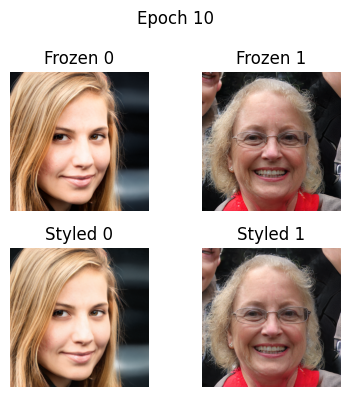

[11/100] Loss: 0.4578 | CLIP: 0.9453 | L2: 0.0107
[12/100] Loss: 0.4199 | CLIP: 0.9019 | L2: 0.0095
[13/100] Loss: 0.4346 | CLIP: 0.9541 | L2: 0.0208
[14/100] Loss: 0.4326 | CLIP: 0.9839 | L2: 0.0235
[15/100] Loss: 0.3846 | CLIP: 0.9287 | L2: 0.0085
[16/100] Loss: 0.3801 | CLIP: 0.9443 | L2: 0.0151
[17/100] Loss: 0.3701 | CLIP: 0.9609 | L2: 0.0114
[18/100] Loss: 0.3597 | CLIP: 0.9565 | L2: 0.0208
[19/100] Loss: 0.3515 | CLIP: 0.9814 | L2: 0.0139
[20/100] Loss: 0.3435 | CLIP: 0.9785 | L2: 0.0261


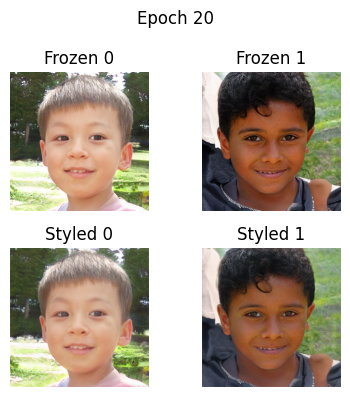

[21/100] Loss: 0.3064 | CLIP: 0.9199 | L2: 0.0151
[22/100] Loss: 0.3129 | CLIP: 0.9517 | L2: 0.0323
[23/100] Loss: 0.3151 | CLIP: 1.0078 | L2: 0.0248
[24/100] Loss: 0.2971 | CLIP: 0.9756 | L2: 0.0316
[25/100] Loss: 0.2848 | CLIP: 0.9746 | L2: 0.0286
[26/100] Loss: 0.2562 | CLIP: 0.9180 | L2: 0.0208
[27/100] Loss: 0.2539 | CLIP: 0.9233 | L2: 0.0357
[28/100] Loss: 0.2559 | CLIP: 0.9482 | L2: 0.0495
[29/100] Loss: 0.2211 | CLIP: 0.8833 | L2: 0.0188
[30/100] Loss: 0.2231 | CLIP: 0.9033 | L2: 0.0345


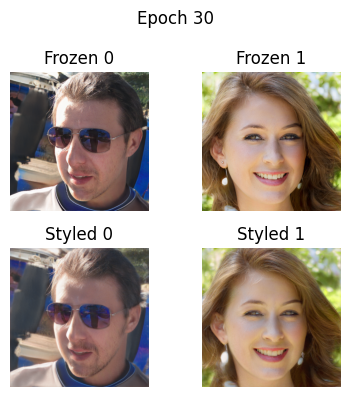

[31/100] Loss: 0.2208 | CLIP: 0.9307 | L2: 0.0313
[32/100] Loss: 0.1978 | CLIP: 0.8652 | L2: 0.0271
[33/100] Loss: 0.2065 | CLIP: 0.9326 | L2: 0.0304
[34/100] Loss: 0.1961 | CLIP: 0.9175 | L2: 0.0282
[35/100] Loss: 0.2003 | CLIP: 0.9551 | L2: 0.0401
[36/100] Loss: 0.1868 | CLIP: 0.9312 | L2: 0.0292
[37/100] Loss: 0.1922 | CLIP: 0.9731 | L2: 0.0443
[38/100] Loss: 0.1767 | CLIP: 0.9121 | L2: 0.0515
[39/100] Loss: 0.1758 | CLIP: 0.9155 | L2: 0.0710
[40/100] Loss: 0.1747 | CLIP: 0.9478 | L2: 0.0645


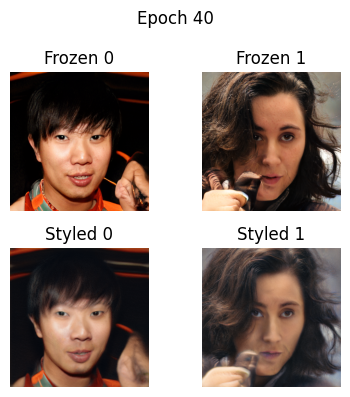

[41/100] Loss: 0.1604 | CLIP: 0.8916 | L2: 0.0663
[42/100] Loss: 0.1565 | CLIP: 0.9395 | L2: 0.0278
[43/100] Loss: 0.1546 | CLIP: 0.8896 | L2: 0.0892
[44/100] Loss: 0.1543 | CLIP: 0.9478 | L2: 0.0604
[45/100] Loss: 0.1463 | CLIP: 0.9365 | L2: 0.0477
[46/100] Loss: 0.1404 | CLIP: 0.9194 | L2: 0.0522
[47/100] Loss: 0.1388 | CLIP: 0.9023 | L2: 0.0850
[48/100] Loss: 0.1302 | CLIP: 0.9165 | L2: 0.0344
[49/100] Loss: 0.1189 | CLIP: 0.8115 | L2: 0.0826
[50/100] Loss: 0.1209 | CLIP: 0.8682 | L2: 0.0644


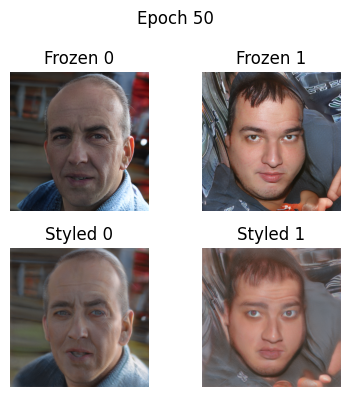

[51/100] Loss: 0.1178 | CLIP: 0.8560 | L2: 0.0780
[52/100] Loss: 0.1212 | CLIP: 0.8975 | L2: 0.0892
[53/100] Loss: 0.1172 | CLIP: 0.9272 | L2: 0.0462
[54/100] Loss: 0.1134 | CLIP: 0.8999 | L2: 0.0675
[55/100] Loss: 0.1070 | CLIP: 0.8833 | L2: 0.0503
[56/100] Loss: 0.1057 | CLIP: 0.9043 | L2: 0.0372
[57/100] Loss: 0.0960 | CLIP: 0.7969 | L2: 0.0873
[58/100] Loss: 0.1085 | CLIP: 0.9258 | L2: 0.0961
[59/100] Loss: 0.0953 | CLIP: 0.8359 | L2: 0.0818
[60/100] Loss: 0.1063 | CLIP: 0.9033 | L2: 0.1570


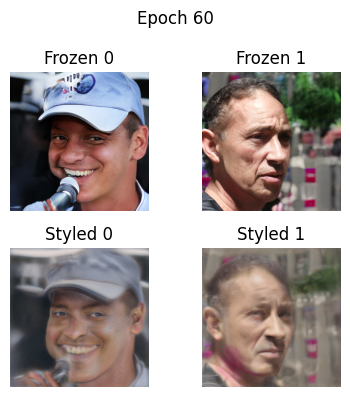

[61/100] Loss: 0.0906 | CLIP: 0.8418 | L2: 0.0671
[62/100] Loss: 0.0970 | CLIP: 0.9141 | L2: 0.0822
[63/100] Loss: 0.0885 | CLIP: 0.8574 | L2: 0.0681
[64/100] Loss: 0.0912 | CLIP: 0.9062 | L2: 0.0667
[65/100] Loss: 0.0943 | CLIP: 0.9106 | L2: 0.1353
[66/100] Loss: 0.0838 | CLIP: 0.8506 | L2: 0.0881
[67/100] Loss: 0.0815 | CLIP: 0.8428 | L2: 0.0888
[68/100] Loss: 0.0825 | CLIP: 0.8525 | L2: 0.1174
[69/100] Loss: 0.0735 | CLIP: 0.7974 | L2: 0.0722
[70/100] Loss: 0.0750 | CLIP: 0.8032 | L2: 0.1160


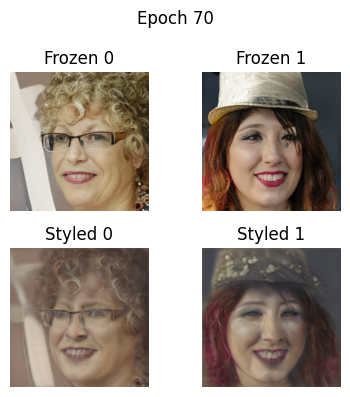

[71/100] Loss: 0.0750 | CLIP: 0.8325 | L2: 0.0955
[72/100] Loss: 0.0784 | CLIP: 0.8672 | L2: 0.1323
[73/100] Loss: 0.0755 | CLIP: 0.8369 | L2: 0.1533
[74/100] Loss: 0.0730 | CLIP: 0.8569 | L2: 0.0970
[75/100] Loss: 0.0736 | CLIP: 0.8467 | L2: 0.1552
[76/100] Loss: 0.0701 | CLIP: 0.8574 | L2: 0.0885
[77/100] Loss: 0.0724 | CLIP: 0.8486 | L2: 0.1826
[78/100] Loss: 0.0642 | CLIP: 0.8140 | L2: 0.0800
[79/100] Loss: 0.0652 | CLIP: 0.8291 | L2: 0.1036
[80/100] Loss: 0.0625 | CLIP: 0.7959 | L2: 0.1244


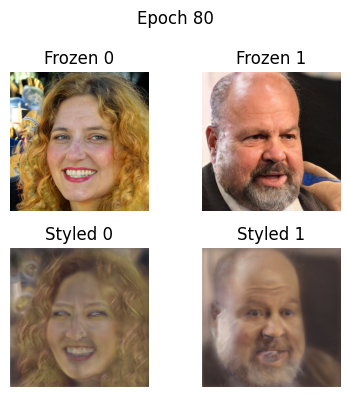

[81/100] Loss: 0.0666 | CLIP: 0.8594 | L2: 0.1396
[82/100] Loss: 0.0616 | CLIP: 0.8188 | L2: 0.1089
[83/100] Loss: 0.0644 | CLIP: 0.8560 | L2: 0.1442
[84/100] Loss: 0.0647 | CLIP: 0.8652 | L2: 0.1641
[85/100] Loss: 0.0651 | CLIP: 0.8828 | L2: 0.1718
[86/100] Loss: 0.0567 | CLIP: 0.8101 | L2: 0.0916
[87/100] Loss: 0.0595 | CLIP: 0.8291 | L2: 0.1689
[88/100] Loss: 0.0570 | CLIP: 0.8462 | L2: 0.0800
[89/100] Loss: 0.0536 | CLIP: 0.7871 | L2: 0.1194
[90/100] Loss: 0.0515 | CLIP: 0.7905 | L2: 0.0669


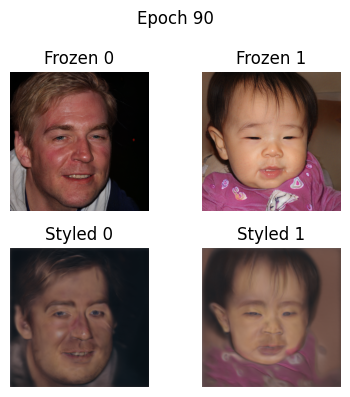

[91/100] Loss: 0.0539 | CLIP: 0.8242 | L2: 0.1035
[92/100] Loss: 0.0549 | CLIP: 0.7949 | L2: 0.2337
[93/100] Loss: 0.0532 | CLIP: 0.8359 | L2: 0.1083
[94/100] Loss: 0.0489 | CLIP: 0.7793 | L2: 0.1001
[95/100] Loss: 0.0513 | CLIP: 0.8115 | L2: 0.1460
[96/100] Loss: 0.0525 | CLIP: 0.8369 | L2: 0.1621
[97/100] Loss: 0.0548 | CLIP: 0.9043 | L2: 0.1283
[98/100] Loss: 0.0490 | CLIP: 0.8164 | L2: 0.1245
[99/100] Loss: 0.0480 | CLIP: 0.8027 | L2: 0.1391
[100/100] Loss: 0.0497 | CLIP: 0.8418 | L2: 0.1482


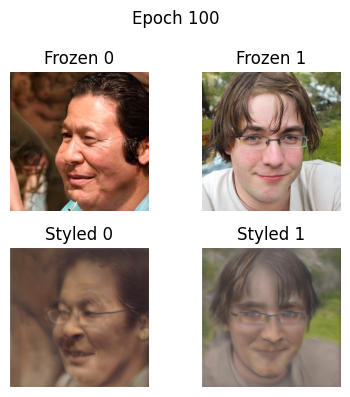

In [ ]:
# Training parameters
torch.manual_seed(42)
trainer = LatentStyleTrainer(
    generator=generator,
    model_clip=model_clip,
    text_features_source=text_features_source,
    text_features_target=text_features_target,
    freeze_fn=lambda model_train, model_frozen, text_target, top_k: freeze_layers(model_train,freeze_mapping=True,freeze_initial_blocks=2,freeze_torgb=True),
    clip_directional_loss=clip_directional_loss_fn,
    latent_dim=latent_dim,
    batch_size=2,
    device=device,
    lr_generator=0.01, #0.008
    lr_lambda=0.05,
    weight_decay=0.0003, #0.003
    lambda_clip_init=1.0,
    lambda_l2_init=1.0,
    scheduler_step_size=80,
    scheduler_gamma=0.0 #0.3
)
# Training
trainer.train(epochs=100, freeze_each_epoch = False, reclassify=False)

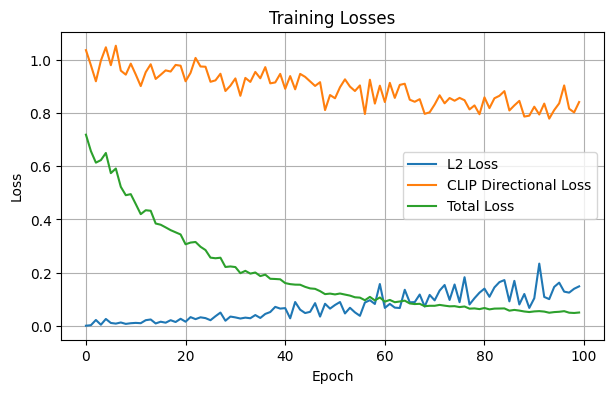

In [ ]:
# Plotting losses
trainer.plot_losses()

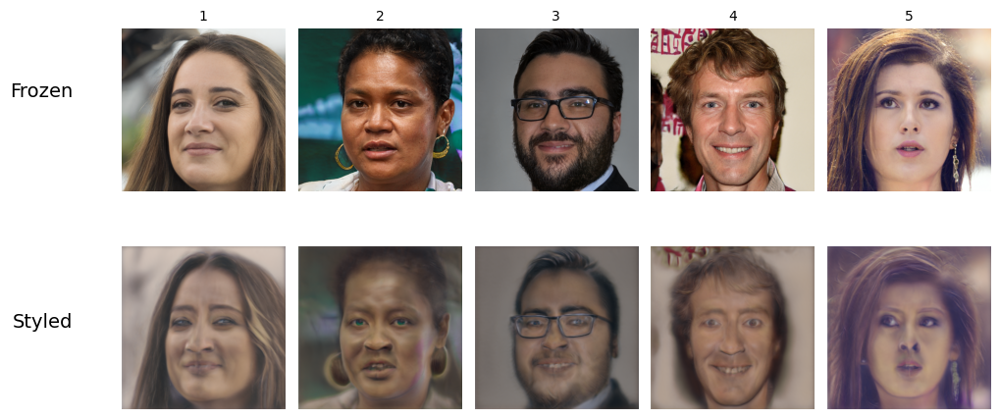

Saved styled images to: ../validation_outputs/freeze_layers/sketch


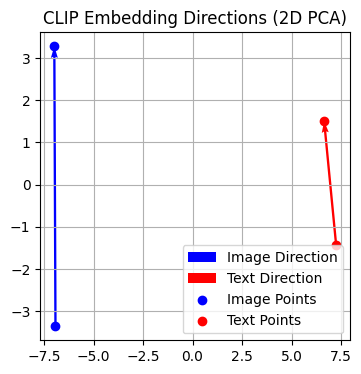

In [ ]:
# Generating test images
generate_visualize_and_save(trainer, seeds, output_dir="../validation_outputs/freeze_layers", folder_name=target_class)

# Visualizing style direction
latent_w_vis = trainer.sample_latent_w(seed=seeds[0]) # Используем первый сид для визуализации
image_frozen_vis, _ = trainer.model["generator_frozen"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
image_styled_vis, _ = trainer.model["generator_train"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
trainer.visualize_clip_directions(image_frozen=image_frozen_vis, image_styled=image_styled_vis,
                                  text_target=text_target, text_source=text_source, preprocess=preprocess)

### 2. Adaptive layer freezing method (Original StyleGAN-NADA approach, Method 2, freeze_layers_adaptive):
In this approach, the number of frozen layers is chosen automatically based on the top-K most relevant blocks for the text query.


[1/60] Loss: 0.6986 | CLIP: 1.0078 | L2: 0.0000
[2/60] Loss: 0.5545 | CLIP: 0.9175 | L2: 0.0057
[3/60] Loss: 0.4807 | CLIP: 0.9126 | L2: 0.0137
[4/60] Loss: 0.4063 | CLIP: 0.9150 | L2: 0.0056
[5/60] Loss: 0.3319 | CLIP: 0.8643 | L2: 0.0126
[6/60] Loss: 0.2838 | CLIP: 0.8740 | L2: 0.0090
[7/60] Loss: 0.2253 | CLIP: 0.8066 | L2: 0.0136
[8/60] Loss: 0.1908 | CLIP: 0.8018 | L2: 0.0131
[9/60] Loss: 0.1828 | CLIP: 0.8984 | L2: 0.0146
[10/60] Loss: 0.1460 | CLIP: 0.8345 | L2: 0.0157


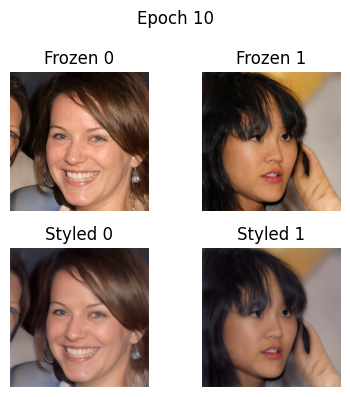

[11/60] Loss: 0.1241 | CLIP: 0.8174 | L2: 0.0205
[12/60] Loss: 0.1189 | CLIP: 0.8887 | L2: 0.0354
[13/60] Loss: 0.1023 | CLIP: 0.8662 | L2: 0.0473
[14/60] Loss: 0.0825 | CLIP: 0.8120 | L2: 0.0372
[15/60] Loss: 0.0764 | CLIP: 0.8608 | L2: 0.0381
[16/60] Loss: 0.0670 | CLIP: 0.8633 | L2: 0.0342
[17/60] Loss: 0.0582 | CLIP: 0.8135 | L2: 0.0636
[18/60] Loss: 0.0514 | CLIP: 0.8125 | L2: 0.0605
[19/60] Loss: 0.0461 | CLIP: 0.8193 | L2: 0.0575
[20/60] Loss: 0.0438 | CLIP: 0.8271 | L2: 0.1015


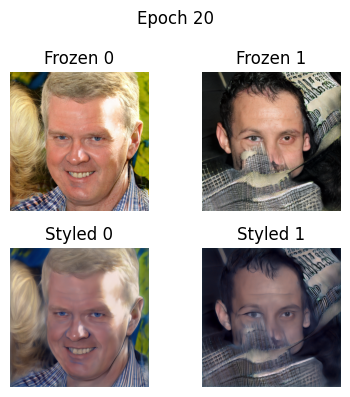

[21/60] Loss: 0.0374 | CLIP: 0.8276 | L2: 0.0484
[22/60] Loss: 0.0324 | CLIP: 0.7612 | L2: 0.0779
[23/60] Loss: 0.0315 | CLIP: 0.8110 | L2: 0.0853
[24/60] Loss: 0.0294 | CLIP: 0.8330 | L2: 0.0776
[25/60] Loss: 0.0260 | CLIP: 0.8101 | L2: 0.0583
[26/60] Loss: 0.0240 | CLIP: 0.7930 | L2: 0.0844
[27/60] Loss: 0.0217 | CLIP: 0.7725 | L2: 0.0793
[28/60] Loss: 0.0209 | CLIP: 0.7910 | L2: 0.0959
[29/60] Loss: 0.0195 | CLIP: 0.7910 | L2: 0.0860
[30/60] Loss: 0.0180 | CLIP: 0.7529 | L2: 0.1362


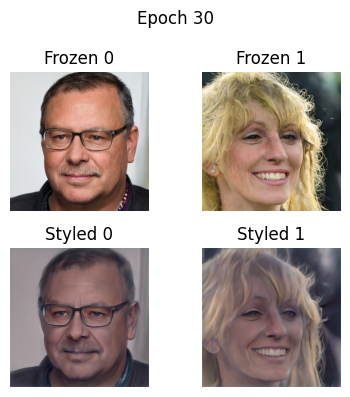

[31/60] Loss: 0.0177 | CLIP: 0.8164 | L2: 0.0781
[32/60] Loss: 0.0173 | CLIP: 0.8076 | L2: 0.1545
[33/60] Loss: 0.0154 | CLIP: 0.7935 | L2: 0.0707
[34/60] Loss: 0.0153 | CLIP: 0.7915 | L2: 0.1639
[35/60] Loss: 0.0134 | CLIP: 0.7441 | L2: 0.1100
[36/60] Loss: 0.0142 | CLIP: 0.8252 | L2: 0.1060
[37/60] Loss: 0.0131 | CLIP: 0.7910 | L2: 0.1129
[38/60] Loss: 0.0123 | CLIP: 0.7773 | L2: 0.1080
[39/60] Loss: 0.0118 | CLIP: 0.7559 | L2: 0.1566
[40/60] Loss: 0.0115 | CLIP: 0.7627 | L2: 0.1620


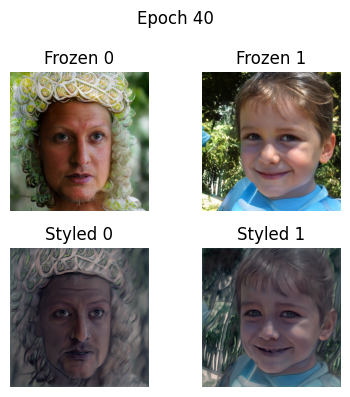

[41/60] Loss: 0.0111 | CLIP: 0.7671 | L2: 0.1633
[42/60] Loss: 0.0112 | CLIP: 0.7998 | L2: 0.1700
[43/60] Loss: 0.0105 | CLIP: 0.7896 | L2: 0.1079
[44/60] Loss: 0.0103 | CLIP: 0.7817 | L2: 0.1638
[45/60] Loss: 0.0109 | CLIP: 0.8184 | L2: 0.2821
[46/60] Loss: 0.0099 | CLIP: 0.7764 | L2: 0.2269
[47/60] Loss: 0.0095 | CLIP: 0.7837 | L2: 0.1642
[48/60] Loss: 0.0100 | CLIP: 0.8311 | L2: 0.2241
[49/60] Loss: 0.0094 | CLIP: 0.7969 | L2: 0.2290
[50/60] Loss: 0.0088 | CLIP: 0.7798 | L2: 0.1471


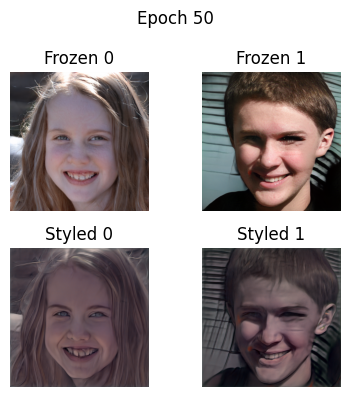

[51/60] Loss: 0.0088 | CLIP: 0.7915 | L2: 0.1905
[52/60] Loss: 0.0087 | CLIP: 0.7832 | L2: 0.2698
[53/60] Loss: 0.0086 | CLIP: 0.8042 | L2: 0.2274
[54/60] Loss: 0.0080 | CLIP: 0.7847 | L2: 0.1290
[55/60] Loss: 0.0083 | CLIP: 0.8154 | L2: 0.2065
[56/60] Loss: 0.0080 | CLIP: 0.8022 | L2: 0.1687
[57/60] Loss: 0.0076 | CLIP: 0.7871 | L2: 0.1278
[58/60] Loss: 0.0073 | CLIP: 0.7666 | L2: 0.1528
[59/60] Loss: 0.0075 | CLIP: 0.7861 | L2: 0.2349
[60/60] Loss: 0.0074 | CLIP: 0.8008 | L2: 0.1311


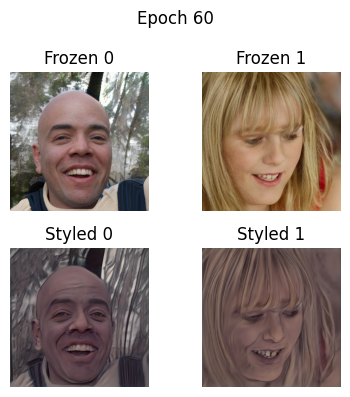

In [ ]:
# Training parameters
top_k = 10
torch.manual_seed(43)
trainer = LatentStyleTrainer(
    generator=generator,
    model_clip=model_clip,
    text_features_source=text_features_source,
    text_features_target=text_features_target,
    freeze_fn=lambda model_train, model_frozen, text, top_k: freeze_layers_adaptive(model_train, model_frozen, text, k=top_k),
    clip_directional_loss=clip_directional_loss_fn,
    latent_dim=latent_dim,
    batch_size=2,
    device=device,
    lr_generator=0.008,
    lr_lambda=0.2,
    weight_decay=0.003,
    lambda_clip_init=1.0,
    lambda_l2_init=1.0,
    scheduler_step_size=40,
    scheduler_gamma=0.3
)
# Training
epochs_to_train = 60
trainer.train(epochs=epochs_to_train, freeze_each_epoch=True, reclassify=False)

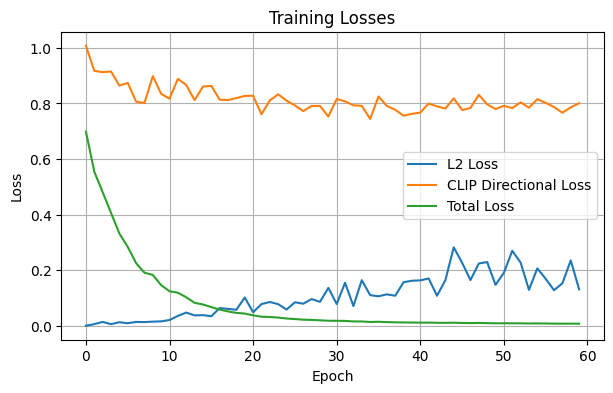

In [ ]:
# Plotting losses
trainer.plot_losses()

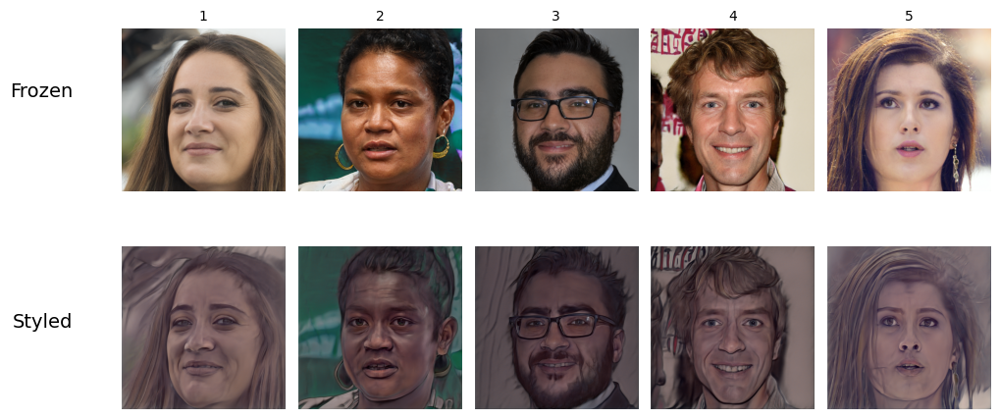

Saved styled images to: ../validation_outputs/freeze_layers_adaptive/sketch


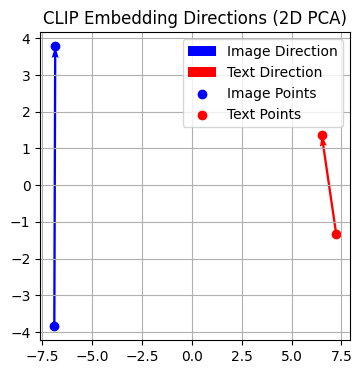

In [ ]:
# Generating test images
generate_visualize_and_save(trainer, seeds, output_dir="../validation_outputs/freeze_layers_adaptive", folder_name=target_class)

# Visualizing style direction
latent_w_vis = trainer.sample_latent_w(seed=seeds[0]) # Используем первый сид для визуализации
image_frozen_vis, _ = trainer.model["generator_frozen"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
image_styled_vis, _ = trainer.model["generator_train"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
trainer.visualize_clip_directions(image_frozen=image_frozen_vis, image_styled=image_styled_vis,
                                  text_target=text_target, text_source=text_source, preprocess=preprocess)

### 3. Adaptive method with partial unfreezing of layers (Experiment 3, freeze_layers_adaptive_fine_grained):
This method freezes not entire blocks, but specific parameters, allowing for more fine-grained control over training.


[1/200] Loss: 0.6447 | CLIP: 0.9302 | L2: 0.0000
[2/200] Loss: 0.5711 | CLIP: 0.9326 | L2: 0.0133
[3/200] Loss: 0.4871 | CLIP: 0.9160 | L2: 0.0196
[4/200] Loss: 0.3910 | CLIP: 0.8682 | L2: 0.0140
[5/200] Loss: 0.3466 | CLIP: 0.8984 | L2: 0.0176
[6/200] Loss: 0.2897 | CLIP: 0.8921 | L2: 0.0119
[7/200] Loss: 0.2291 | CLIP: 0.8223 | L2: 0.0161
[8/200] Loss: 0.2012 | CLIP: 0.8545 | L2: 0.0126
[9/200] Loss: 0.1800 | CLIP: 0.8965 | L2: 0.0132
[10/200] Loss: 0.1520 | CLIP: 0.8887 | L2: 0.0111


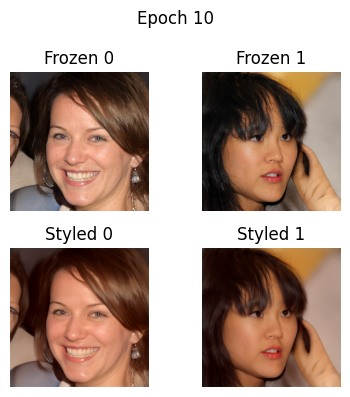

[11/200] Loss: 0.1233 | CLIP: 0.8340 | L2: 0.0144
[12/200] Loss: 0.1174 | CLIP: 0.9141 | L2: 0.0207
[13/200] Loss: 0.0916 | CLIP: 0.8184 | L2: 0.0222
[14/200] Loss: 0.0784 | CLIP: 0.8086 | L2: 0.0192
[15/200] Loss: 0.0712 | CLIP: 0.8418 | L2: 0.0177
[16/200] Loss: 0.0601 | CLIP: 0.8047 | L2: 0.0179
[17/200] Loss: 0.0575 | CLIP: 0.8467 | L2: 0.0345
[18/200] Loss: 0.0495 | CLIP: 0.8232 | L2: 0.0296
[19/200] Loss: 0.0477 | CLIP: 0.8896 | L2: 0.0291
[20/200] Loss: 0.0422 | CLIP: 0.8389 | L2: 0.0519


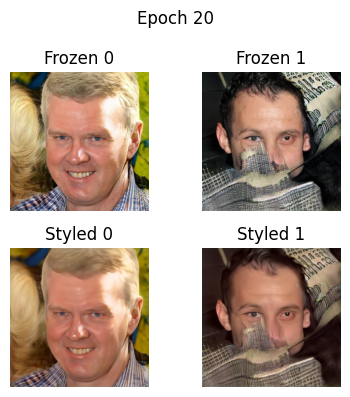

[21/200] Loss: 0.0355 | CLIP: 0.8125 | L2: 0.0269
[22/200] Loss: 0.0309 | CLIP: 0.7661 | L2: 0.0329
[23/200] Loss: 0.0301 | CLIP: 0.8086 | L2: 0.0399
[24/200] Loss: 0.0297 | CLIP: 0.8706 | L2: 0.0432
[25/200] Loss: 0.0261 | CLIP: 0.8394 | L2: 0.0337
[26/200] Loss: 0.0230 | CLIP: 0.7842 | L2: 0.0401
[27/200] Loss: 0.0226 | CLIP: 0.8320 | L2: 0.0406
[28/200] Loss: 0.0201 | CLIP: 0.7881 | L2: 0.0423
[29/200] Loss: 0.0191 | CLIP: 0.7949 | L2: 0.0460
[30/200] Loss: 0.0175 | CLIP: 0.7578 | L2: 0.0592


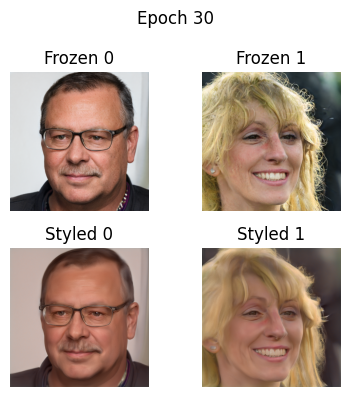

[31/200] Loss: 0.0180 | CLIP: 0.8477 | L2: 0.0450
[32/200] Loss: 0.0171 | CLIP: 0.8247 | L2: 0.0681
[33/200] Loss: 0.0159 | CLIP: 0.8438 | L2: 0.0319
[34/200] Loss: 0.0151 | CLIP: 0.7983 | L2: 0.0746
[35/200] Loss: 0.0136 | CLIP: 0.7729 | L2: 0.0540
[36/200] Loss: 0.0134 | CLIP: 0.8027 | L2: 0.0466
[37/200] Loss: 0.0133 | CLIP: 0.8193 | L2: 0.0626
[38/200] Loss: 0.0133 | CLIP: 0.8652 | L2: 0.0497
[39/200] Loss: 0.0122 | CLIP: 0.7861 | L2: 0.0880
[40/200] Loss: 0.0118 | CLIP: 0.7769 | L2: 0.1001


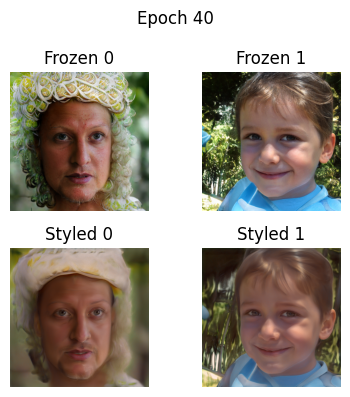

[41/200] Loss: 0.0122 | CLIP: 0.8545 | L2: 0.0820
[42/200] Loss: 0.0106 | CLIP: 0.7725 | L2: 0.0713
[43/200] Loss: 0.0102 | CLIP: 0.7881 | L2: 0.0442
[44/200] Loss: 0.0103 | CLIP: 0.7939 | L2: 0.0800
[45/200] Loss: 0.0104 | CLIP: 0.8115 | L2: 0.0990
[46/200] Loss: 0.0101 | CLIP: 0.8184 | L2: 0.0909
[47/200] Loss: 0.0092 | CLIP: 0.7612 | L2: 0.0894
[48/200] Loss: 0.0098 | CLIP: 0.8330 | L2: 0.0934
[49/200] Loss: 0.0093 | CLIP: 0.8115 | L2: 0.0950
[50/200] Loss: 0.0087 | CLIP: 0.7930 | L2: 0.0731


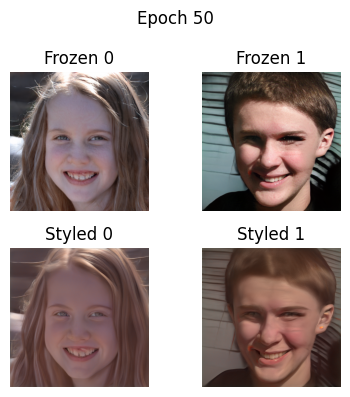

[51/200] Loss: 0.0085 | CLIP: 0.7622 | L2: 0.1149
[52/200] Loss: 0.0084 | CLIP: 0.7764 | L2: 0.1044
[53/200] Loss: 0.0089 | CLIP: 0.8369 | L2: 0.1263
[54/200] Loss: 0.0081 | CLIP: 0.8115 | L2: 0.0671
[55/200] Loss: 0.0091 | CLIP: 0.9062 | L2: 0.1106
[56/200] Loss: 0.0083 | CLIP: 0.8623 | L2: 0.0647
[57/200] Loss: 0.0080 | CLIP: 0.8501 | L2: 0.0606
[58/200] Loss: 0.0073 | CLIP: 0.7822 | L2: 0.0806
[59/200] Loss: 0.0072 | CLIP: 0.7651 | L2: 0.1152
[60/200] Loss: 0.0075 | CLIP: 0.8281 | L2: 0.0848


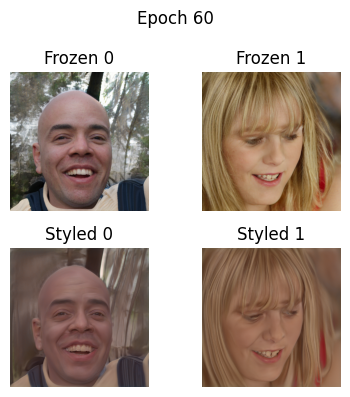

[61/200] Loss: 0.0074 | CLIP: 0.8188 | L2: 0.1055
[62/200] Loss: 0.0068 | CLIP: 0.7769 | L2: 0.0849
[63/200] Loss: 0.0070 | CLIP: 0.8105 | L2: 0.0932
[64/200] Loss: 0.0071 | CLIP: 0.8418 | L2: 0.0835
[65/200] Loss: 0.0072 | CLIP: 0.8799 | L2: 0.0604
[66/200] Loss: 0.0067 | CLIP: 0.7607 | L2: 0.1947
[67/200] Loss: 0.0067 | CLIP: 0.7700 | L2: 0.1916
[68/200] Loss: 0.0066 | CLIP: 0.8262 | L2: 0.0767
[69/200] Loss: 0.0068 | CLIP: 0.8438 | L2: 0.1435
[70/200] Loss: 0.0062 | CLIP: 0.7793 | L2: 0.1161


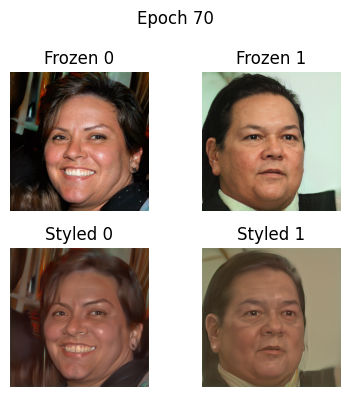

[71/200] Loss: 0.0065 | CLIP: 0.8101 | L2: 0.1641
[72/200] Loss: 0.0064 | CLIP: 0.8521 | L2: 0.0688
[73/200] Loss: 0.0057 | CLIP: 0.7661 | L2: 0.0924
[74/200] Loss: 0.0058 | CLIP: 0.7754 | L2: 0.1103
[75/200] Loss: 0.0060 | CLIP: 0.8203 | L2: 0.1101
[76/200] Loss: 0.0059 | CLIP: 0.8052 | L2: 0.1395
[77/200] Loss: 0.0055 | CLIP: 0.7842 | L2: 0.0644
[78/200] Loss: 0.0058 | CLIP: 0.8018 | L2: 0.1527
[79/200] Loss: 0.0057 | CLIP: 0.8262 | L2: 0.0925
[80/200] Loss: 0.0054 | CLIP: 0.7900 | L2: 0.1030


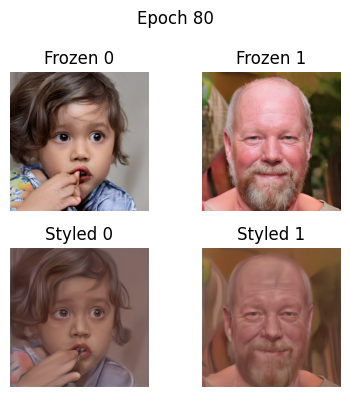

[81/200] Loss: 0.0056 | CLIP: 0.8369 | L2: 0.0759
[82/200] Loss: 0.0054 | CLIP: 0.8071 | L2: 0.0999
[83/200] Loss: 0.0053 | CLIP: 0.8105 | L2: 0.0820
[84/200] Loss: 0.0051 | CLIP: 0.7568 | L2: 0.1477
[85/200] Loss: 0.0051 | CLIP: 0.7910 | L2: 0.0847
[86/200] Loss: 0.0051 | CLIP: 0.7852 | L2: 0.1250
[87/200] Loss: 0.0051 | CLIP: 0.7925 | L2: 0.1242
[88/200] Loss: 0.0050 | CLIP: 0.7920 | L2: 0.1047
[89/200] Loss: 0.0049 | CLIP: 0.7812 | L2: 0.1250
[90/200] Loss: 0.0049 | CLIP: 0.7925 | L2: 0.1157


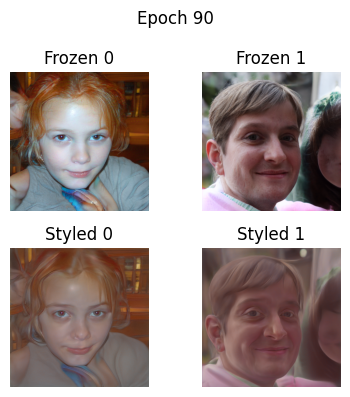

[91/200] Loss: 0.0047 | CLIP: 0.7705 | L2: 0.1137
[92/200] Loss: 0.0048 | CLIP: 0.8057 | L2: 0.1058
[93/200] Loss: 0.0048 | CLIP: 0.7964 | L2: 0.1317
[94/200] Loss: 0.0051 | CLIP: 0.8608 | L2: 0.1509
[95/200] Loss: 0.0046 | CLIP: 0.7856 | L2: 0.0993
[96/200] Loss: 0.0046 | CLIP: 0.7866 | L2: 0.1488
[97/200] Loss: 0.0047 | CLIP: 0.7988 | L2: 0.1631
[98/200] Loss: 0.0044 | CLIP: 0.7837 | L2: 0.1025
[99/200] Loss: 0.0048 | CLIP: 0.8330 | L2: 0.1773
[100/200] Loss: 0.0043 | CLIP: 0.7876 | L2: 0.1073


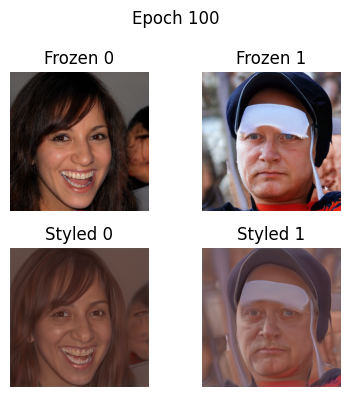

[101/200] Loss: 0.0050 | CLIP: 0.8838 | L2: 0.2240
[102/200] Loss: 0.0042 | CLIP: 0.7632 | L2: 0.1254
[103/200] Loss: 0.0042 | CLIP: 0.7803 | L2: 0.1135
[104/200] Loss: 0.0043 | CLIP: 0.8008 | L2: 0.1323
[105/200] Loss: 0.0041 | CLIP: 0.7695 | L2: 0.1488
[106/200] Loss: 0.0039 | CLIP: 0.7598 | L2: 0.1033
[107/200] Loss: 0.0041 | CLIP: 0.8057 | L2: 0.0944
[108/200] Loss: 0.0043 | CLIP: 0.8374 | L2: 0.1146
[109/200] Loss: 0.0040 | CLIP: 0.8101 | L2: 0.0772
[110/200] Loss: 0.0039 | CLIP: 0.7588 | L2: 0.1798


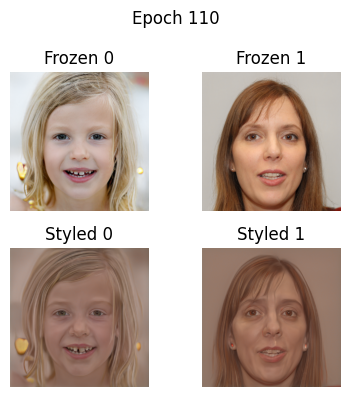

[111/200] Loss: 0.0040 | CLIP: 0.7935 | L2: 0.1478
[112/200] Loss: 0.0039 | CLIP: 0.7827 | L2: 0.1803
[113/200] Loss: 0.0037 | CLIP: 0.7632 | L2: 0.0787
[114/200] Loss: 0.0038 | CLIP: 0.7866 | L2: 0.1254
[115/200] Loss: 0.0040 | CLIP: 0.8252 | L2: 0.1838
[116/200] Loss: 0.0039 | CLIP: 0.8174 | L2: 0.1589
[117/200] Loss: 0.0038 | CLIP: 0.7744 | L2: 0.2078
[118/200] Loss: 0.0040 | CLIP: 0.8770 | L2: 0.0862
[119/200] Loss: 0.0037 | CLIP: 0.8071 | L2: 0.1110
[120/200] Loss: 0.0035 | CLIP: 0.7876 | L2: 0.0791


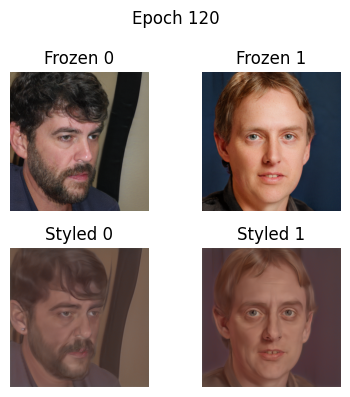

[121/200] Loss: 0.0035 | CLIP: 0.7803 | L2: 0.1063
[122/200] Loss: 0.0036 | CLIP: 0.7920 | L2: 0.1631
[123/200] Loss: 0.0038 | CLIP: 0.8247 | L2: 0.2464
[124/200] Loss: 0.0035 | CLIP: 0.7910 | L2: 0.1048
[125/200] Loss: 0.0035 | CLIP: 0.8105 | L2: 0.1063
[126/200] Loss: 0.0036 | CLIP: 0.8047 | L2: 0.2048
[127/200] Loss: 0.0034 | CLIP: 0.7705 | L2: 0.1986
[128/200] Loss: 0.0036 | CLIP: 0.8193 | L2: 0.2175
[129/200] Loss: 0.0035 | CLIP: 0.8135 | L2: 0.1691
[130/200] Loss: 0.0035 | CLIP: 0.8169 | L2: 0.1717


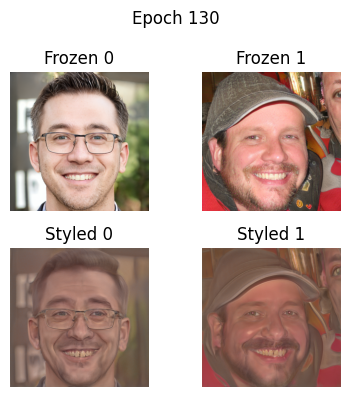

[131/200] Loss: 0.0035 | CLIP: 0.8438 | L2: 0.1297
[132/200] Loss: 0.0031 | CLIP: 0.7578 | L2: 0.1234
[133/200] Loss: 0.0032 | CLIP: 0.7817 | L2: 0.1325
[134/200] Loss: 0.0032 | CLIP: 0.7954 | L2: 0.1248
[135/200] Loss: 0.0032 | CLIP: 0.8022 | L2: 0.1225
[136/200] Loss: 0.0031 | CLIP: 0.7588 | L2: 0.1589
[137/200] Loss: 0.0032 | CLIP: 0.8198 | L2: 0.1470
[138/200] Loss: 0.0031 | CLIP: 0.7910 | L2: 0.1535
[139/200] Loss: 0.0029 | CLIP: 0.7417 | L2: 0.1481
[140/200] Loss: 0.0032 | CLIP: 0.8120 | L2: 0.1880


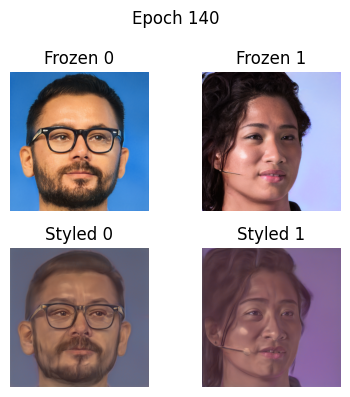

[141/200] Loss: 0.0032 | CLIP: 0.8218 | L2: 0.1995
[142/200] Loss: 0.0029 | CLIP: 0.7637 | L2: 0.1640
[143/200] Loss: 0.0030 | CLIP: 0.8008 | L2: 0.0952
[144/200] Loss: 0.0030 | CLIP: 0.8003 | L2: 0.1482
[145/200] Loss: 0.0030 | CLIP: 0.8105 | L2: 0.0986
[146/200] Loss: 0.0031 | CLIP: 0.8252 | L2: 0.1692
[147/200] Loss: 0.0028 | CLIP: 0.7861 | L2: 0.1049
[148/200] Loss: 0.0028 | CLIP: 0.7788 | L2: 0.1301
[149/200] Loss: 0.0028 | CLIP: 0.7939 | L2: 0.1164
[150/200] Loss: 0.0028 | CLIP: 0.7783 | L2: 0.1283


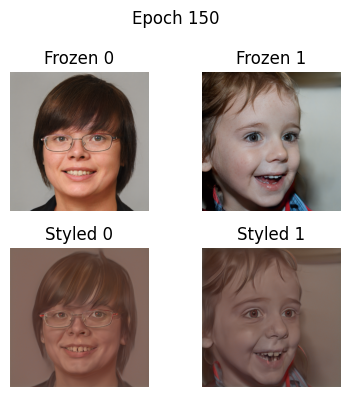

[151/200] Loss: 0.0031 | CLIP: 0.8638 | L2: 0.2179
[152/200] Loss: 0.0027 | CLIP: 0.7705 | L2: 0.1198
[153/200] Loss: 0.0029 | CLIP: 0.8022 | L2: 0.2238
[154/200] Loss: 0.0026 | CLIP: 0.7676 | L2: 0.1097
[155/200] Loss: 0.0029 | CLIP: 0.8506 | L2: 0.1720
[156/200] Loss: 0.0027 | CLIP: 0.7944 | L2: 0.0881
[157/200] Loss: 0.0027 | CLIP: 0.8081 | L2: 0.1541
[158/200] Loss: 0.0025 | CLIP: 0.7412 | L2: 0.0979
[159/200] Loss: 0.0026 | CLIP: 0.7778 | L2: 0.1919
[160/200] Loss: 0.0027 | CLIP: 0.8223 | L2: 0.1667


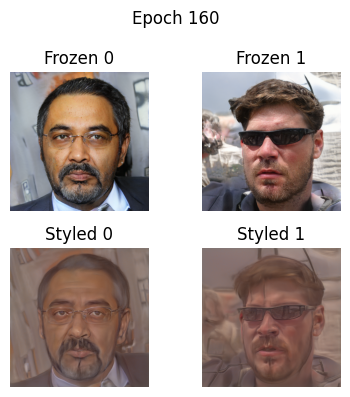

[161/200] Loss: 0.0026 | CLIP: 0.7993 | L2: 0.0734
[162/200] Loss: 0.0026 | CLIP: 0.7788 | L2: 0.2663
[163/200] Loss: 0.0024 | CLIP: 0.7285 | L2: 0.1594
[164/200] Loss: 0.0026 | CLIP: 0.8193 | L2: 0.1590
[165/200] Loss: 0.0027 | CLIP: 0.8511 | L2: 0.1810
[166/200] Loss: 0.0025 | CLIP: 0.7681 | L2: 0.1864
[167/200] Loss: 0.0024 | CLIP: 0.7627 | L2: 0.1433
[168/200] Loss: 0.0026 | CLIP: 0.8325 | L2: 0.1842
[169/200] Loss: 0.0025 | CLIP: 0.8174 | L2: 0.1034
[170/200] Loss: 0.0023 | CLIP: 0.7485 | L2: 0.1130


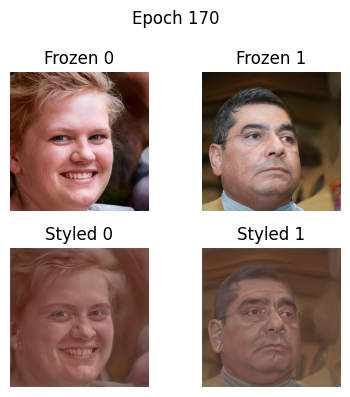

[171/200] Loss: 0.0023 | CLIP: 0.7744 | L2: 0.1082
[172/200] Loss: 0.0024 | CLIP: 0.7954 | L2: 0.1802
[173/200] Loss: 0.0024 | CLIP: 0.8018 | L2: 0.0887
[174/200] Loss: 0.0023 | CLIP: 0.7686 | L2: 0.1096
[175/200] Loss: 0.0025 | CLIP: 0.8345 | L2: 0.1312
[176/200] Loss: 0.0023 | CLIP: 0.7856 | L2: 0.1062
[177/200] Loss: 0.0023 | CLIP: 0.7852 | L2: 0.1821
[178/200] Loss: 0.0024 | CLIP: 0.8135 | L2: 0.1466
[179/200] Loss: 0.0024 | CLIP: 0.8252 | L2: 0.1634
[180/200] Loss: 0.0023 | CLIP: 0.8003 | L2: 0.1480


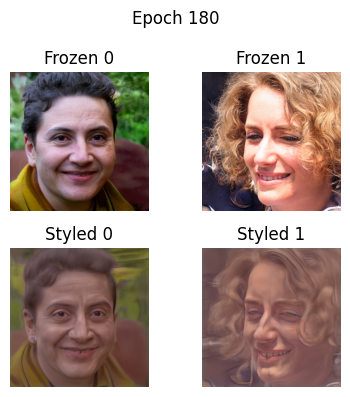

[181/200] Loss: 0.0023 | CLIP: 0.8130 | L2: 0.1600
[182/200] Loss: 0.0022 | CLIP: 0.7734 | L2: 0.1734
[183/200] Loss: 0.0023 | CLIP: 0.8384 | L2: 0.0937
[184/200] Loss: 0.0022 | CLIP: 0.7930 | L2: 0.1535
[185/200] Loss: 0.0022 | CLIP: 0.8081 | L2: 0.1348
[186/200] Loss: 0.0023 | CLIP: 0.8369 | L2: 0.1388
[187/200] Loss: 0.0022 | CLIP: 0.7920 | L2: 0.1348
[188/200] Loss: 0.0023 | CLIP: 0.8379 | L2: 0.1932
[189/200] Loss: 0.0022 | CLIP: 0.8193 | L2: 0.1652
[190/200] Loss: 0.0022 | CLIP: 0.8237 | L2: 0.1986


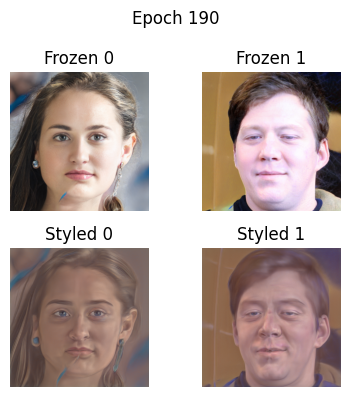

[191/200] Loss: 0.0020 | CLIP: 0.7764 | L2: 0.0990
[192/200] Loss: 0.0022 | CLIP: 0.8203 | L2: 0.1261
[193/200] Loss: 0.0020 | CLIP: 0.7671 | L2: 0.1301
[194/200] Loss: 0.0021 | CLIP: 0.7939 | L2: 0.1966
[195/200] Loss: 0.0020 | CLIP: 0.7861 | L2: 0.0811
[196/200] Loss: 0.0020 | CLIP: 0.7939 | L2: 0.1352
[197/200] Loss: 0.0021 | CLIP: 0.8008 | L2: 0.1810
[198/200] Loss: 0.0021 | CLIP: 0.7910 | L2: 0.2429
[199/200] Loss: 0.0020 | CLIP: 0.7856 | L2: 0.1982
[200/200] Loss: 0.0020 | CLIP: 0.7798 | L2: 0.1557


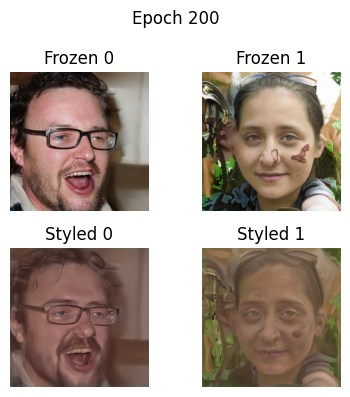

In [ ]:
# Training parameters
top_k = 10
torch.manual_seed(43)
trainer = LatentStyleTrainer(
    generator=generator,
    model_clip=model_clip,
    text_features_source=text_features_source,
    text_features_target=text_features_target,
    freeze_fn=lambda model_train, model_frozen, text, top_k: freeze_layers_adaptive_fine_grained(model_train, model_frozen, text, k=top_k),
    clip_directional_loss=clip_directional_loss_fn,
    latent_dim=latent_dim,
    batch_size=2,
    device=device,
    lr_generator=0.012,
    lr_lambda=0.2,
    weight_decay=0.0003, #с лучше
    lambda_clip_init=1.0,
    lambda_l2_init=1.0,
    scheduler_step_size=60,
    scheduler_gamma=0.3
)
# Training
trainer.train(epochs=200, freeze_each_epoch = True, reclassify=False)

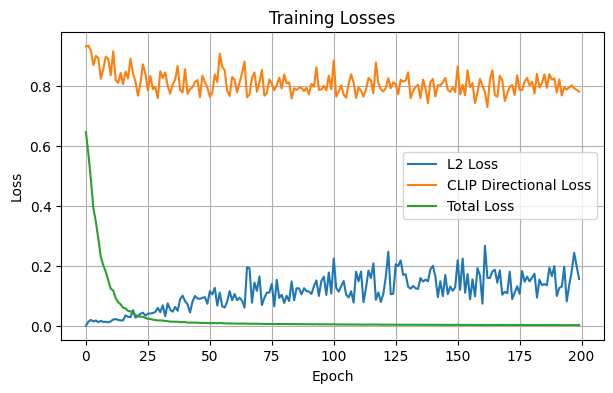

In [ ]:
# Plotting losses
trainer.plot_losses()

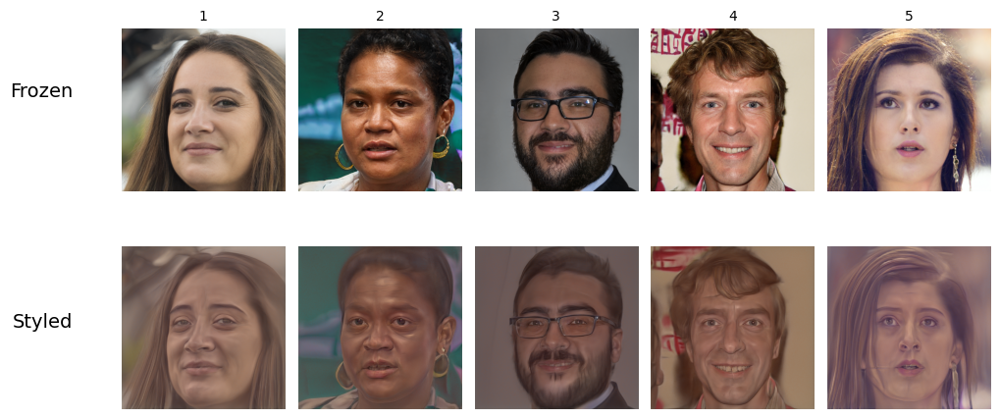

Saved styled images to: ../validation_outputs/freeze_layers_adaptive_fine_grained/sketch


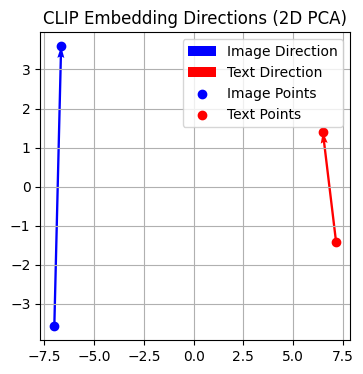

In [ ]:
# Generating test images
generate_visualize_and_save(trainer, seeds, output_dir="../validation_outputs/freeze_layers_adaptive_fine_grained", folder_name=target_class)

# Visualizing style direction
latent_w_vis = trainer.sample_latent_w(seed=seeds[0]) # Используем первый сид для визуализации
image_frozen_vis, _ = trainer.model["generator_frozen"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
image_styled_vis, _ = trainer.model["generator_train"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
trainer.visualize_clip_directions(image_frozen=image_frozen_vis, image_styled=image_styled_vis,
                                  text_target=text_target, text_source=text_source, preprocess=preprocess)

### 4. Adaptive method with choosing the most sensitive parameters (Experiment 4, freeze_layers_adaptive_fine_tune):
Instead of freezing some layers, we adaptively fine-tune only the most important ones.


[1/30] Loss: 0.7168 | CLIP: 1.0342 | L2: 0.0000
[2/30] Loss: 0.5894 | CLIP: 0.9790 | L2: 0.0038
[3/30] Loss: 0.5267 | CLIP: 0.9736 | L2: 0.0309
[4/30] Loss: 0.4212 | CLIP: 0.9497 | L2: 0.0055
[5/30] Loss: 0.3887 | CLIP: 0.9941 | L2: 0.0251
[6/30] Loss: 0.3286 | CLIP: 0.9883 | L2: 0.0246
[7/30] Loss: 0.2757 | CLIP: 0.9863 | L2: 0.0184
[8/30] Loss: 0.2472 | CLIP: 1.0156 | L2: 0.0333
[9/30] Loss: 0.1957 | CLIP: 0.9624 | L2: 0.0213
[10/30] Loss: 0.1728 | CLIP: 0.9800 | L2: 0.0312


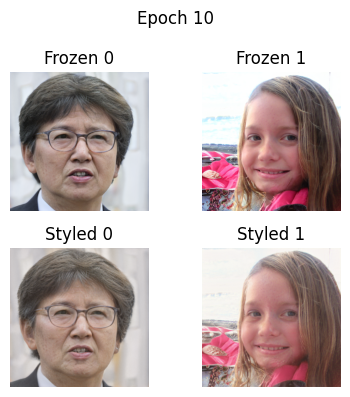

[11/30] Loss: 0.1476 | CLIP: 0.9580 | L2: 0.0426
[12/30] Loss: 0.1311 | CLIP: 0.9819 | L2: 0.0489
[13/30] Loss: 0.1169 | CLIP: 0.9775 | L2: 0.0736
[14/30] Loss: 0.0919 | CLIP: 0.9355 | L2: 0.0368
[15/30] Loss: 0.0919 | CLIP: 1.0254 | L2: 0.0723
[16/30] Loss: 0.0695 | CLIP: 0.9097 | L2: 0.0466
[17/30] Loss: 0.0642 | CLIP: 0.9463 | L2: 0.0530
[18/30] Loss: 0.0553 | CLIP: 0.8965 | L2: 0.0690
[19/30] Loss: 0.0500 | CLIP: 0.9048 | L2: 0.0726
[20/30] Loss: 0.0483 | CLIP: 0.9131 | L2: 0.1287


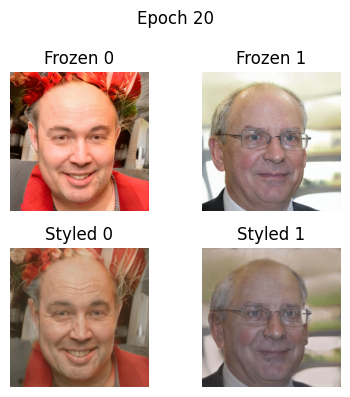

[21/30] Loss: 0.0429 | CLIP: 0.8989 | L2: 0.1288
[22/30] Loss: 0.0379 | CLIP: 0.8955 | L2: 0.1128
[23/30] Loss: 0.0334 | CLIP: 0.8887 | L2: 0.0893
[24/30] Loss: 0.0296 | CLIP: 0.8633 | L2: 0.0856
[25/30] Loss: 0.0272 | CLIP: 0.8545 | L2: 0.0958
[26/30] Loss: 0.0253 | CLIP: 0.8403 | L2: 0.1169
[27/30] Loss: 0.0242 | CLIP: 0.8486 | L2: 0.1435
[28/30] Loss: 0.0217 | CLIP: 0.8345 | L2: 0.1157
[29/30] Loss: 0.0195 | CLIP: 0.8193 | L2: 0.0903
[30/30] Loss: 0.0194 | CLIP: 0.8472 | L2: 0.1261


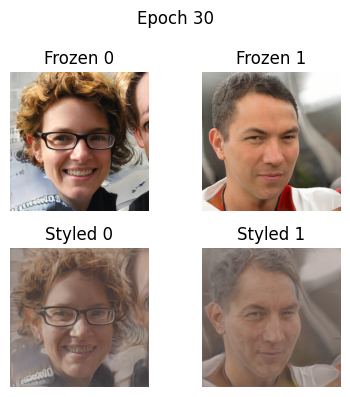

In [ ]:
# Training parameters
top_k = 5
torch.manual_seed(43)
trainer = LatentStyleTrainer(
    generator=generator,
    model_clip=model_clip,
    text_features_source=text_features_source,
    text_features_target=text_features_target,
    freeze_fn=lambda model_train, model_frozen, text, top_k: freeze_layers_adaptive_fine_tune(model_train, model_frozen, text, k=top_k),
    clip_directional_loss=clip_directional_loss_fn,
    latent_dim=latent_dim,
    batch_size=2,
    device=device,
    lr_generator=0.02,
    lr_lambda=0.2,
    weight_decay=0.003,
    lambda_clip_init=1.0,
    lambda_l2_init=1.0,
    scheduler_step_size=100,
    scheduler_gamma=0.1
)

# Training
trainer.train(epochs=30, freeze_each_epoch = True, reclassify=False)

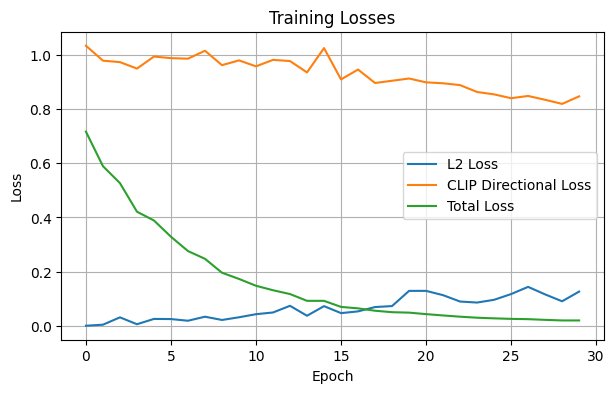

In [ ]:
# Plotting losses
trainer.plot_losses()

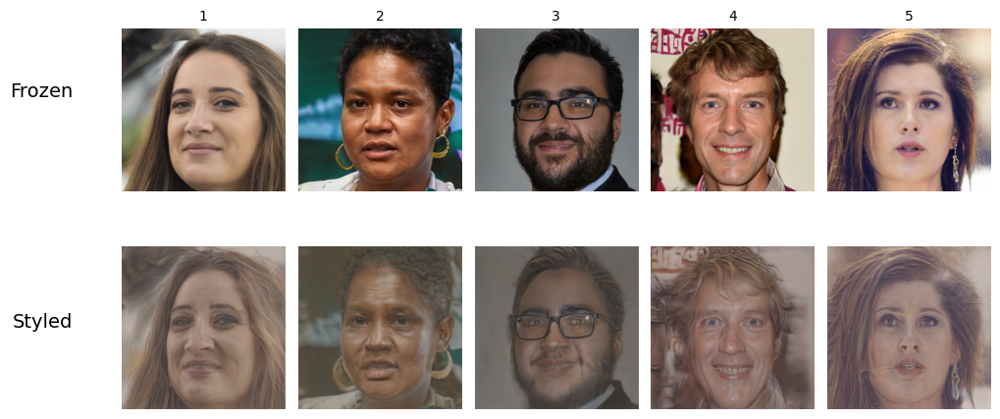

Saved styled images to: ../validation_outputs/freeze_layers_adaptive_fine_tune/sketch


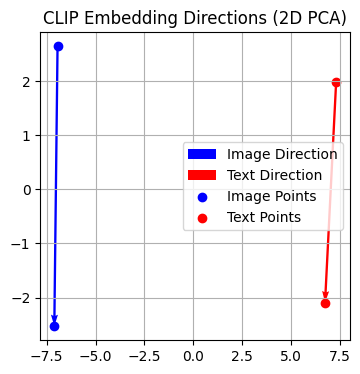

In [ ]:
# Generating test images
generate_visualize_and_save(trainer, seeds, output_dir="../validation_outputs/freeze_layers_adaptive_fine_tune", folder_name=target_class)

# Visualizing style direction
latent_w_vis = trainer.sample_latent_w(seed=seeds[0]) # Используем первый сид для визуализации
image_frozen_vis, _ = trainer.model["generator_frozen"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
image_styled_vis, _ = trainer.model["generator_train"]([latent_w_vis], input_is_latent=True, randomize_noise=False)
trainer.visualize_clip_directions(image_frozen=image_frozen_vis, image_styled=image_styled_vis,
                                  text_target=text_target, text_source=text_source, preprocess=preprocess)

### 5. Selecting the source text

In this section, we will test how the CLIP model changes the perception of images

In [ ]:
# CLIP image classification
classes_100 = []
with open('/content/StyleGAN-nada/dataset/classes.csv', 'r') as csvfile:
    reader = csv.reader(csvfile)
    for row in reader:
        classes_100.append(row[0])

# Prepare the inputs
text_inputs = torch.cat([clip.tokenize(f"a photo of a {c}") for c in classes_100]).to(device)

# Calculate features
with torch.no_grad():
    text_features_cat = model_clip.encode_text(text_inputs)

def clip_classification(cl_image, cl_text_features, cl_print=True):
    image_input = preprocess(cl_image).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model_clip.encode_image(image_input)
    # Pick the most similar label for the image
    image_features /= image_features.norm(dim=-1, keepdim=True)
    cl_text_features /= cl_text_features.norm(dim=-1, keepdim=True)
    similarity = (100.0 * image_features @ cl_text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(1)

    if cl_print:
        for value, index in zip(values, indices):
            print('-'*20)
            print(f"{classes_100[index]:>1s}: {100 * value.item():.2f}%")
    return classes_100[indices[0]]

--------------------
man: 59.81%
[1/60] Loss: 0.6965 | CLIP: 1.0049 | L2: 0.0000
--------------------
man: 66.06%
[2/60] Loss: 0.6357 | CLIP: 1.0537 | L2: 0.0054
--------------------
woman: 54.15%
[3/60] Loss: 0.5167 | CLIP: 0.9644 | L2: 0.0253
--------------------
woman: 68.85%
[4/60] Loss: 0.4227 | CLIP: 0.9570 | L2: 0.0039
--------------------
boy: 94.92%
[5/60] Loss: 0.3912 | CLIP: 1.0225 | L2: 0.0137
--------------------
woman: 41.36%
[6/60] Loss: 0.3072 | CLIP: 0.9561 | L2: 0.0058
--------------------
girl: 47.07%
[7/60] Loss: 0.2376 | CLIP: 0.8652 | L2: 0.0078
--------------------
man: 44.41%
[8/60] Loss: 0.2336 | CLIP: 0.9878 | L2: 0.0149
--------------------
woman: 91.06%
[9/60] Loss: 0.1937 | CLIP: 0.9688 | L2: 0.0097
--------------------
woman: 41.48%
[10/60] Loss: 0.1585 | CLIP: 0.9238 | L2: 0.0110


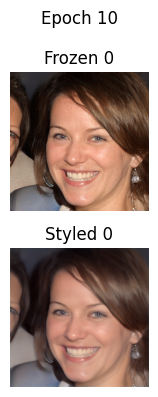

--------------------
girl: 36.82%
[11/60] Loss: 0.1410 | CLIP: 0.9395 | L2: 0.0205
--------------------
baby: 58.89%
[12/60] Loss: 0.1183 | CLIP: 0.8999 | L2: 0.0270
--------------------
woman: 81.10%
[13/60] Loss: 0.1048 | CLIP: 0.9106 | L2: 0.0325
--------------------
man: 78.71%
[14/60] Loss: 0.0923 | CLIP: 0.9233 | L2: 0.0318
--------------------
man: 74.90%
[15/60] Loss: 0.0840 | CLIP: 0.9604 | L2: 0.0326
--------------------
man: 62.21%
[16/60] Loss: 0.0722 | CLIP: 0.9512 | L2: 0.0252
--------------------
man: 70.70%
[17/60] Loss: 0.0632 | CLIP: 0.8901 | L2: 0.0529
--------------------
woman: 87.60%
[18/60] Loss: 0.0509 | CLIP: 0.8403 | L2: 0.0290
--------------------
baby: 59.28%
[19/60] Loss: 0.0471 | CLIP: 0.8491 | L2: 0.0428
--------------------
man: 69.38%
[20/60] Loss: 0.0442 | CLIP: 0.8662 | L2: 0.0568


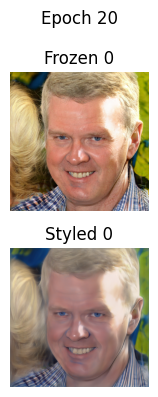

--------------------
woman: 50.73%
[21/60] Loss: 0.0398 | CLIP: 0.8799 | L2: 0.0459
--------------------
girl: 91.75%
[22/60] Loss: 0.0354 | CLIP: 0.8184 | L2: 0.0743
--------------------
man: 38.94%
[23/60] Loss: 0.0332 | CLIP: 0.8848 | L2: 0.0474
--------------------
man: 47.49%
[24/60] Loss: 0.0343 | CLIP: 0.9541 | L2: 0.0852
--------------------
woman: 87.89%
[25/60] Loss: 0.0292 | CLIP: 0.9229 | L2: 0.0470
--------------------
girl: 83.40%
[26/60] Loss: 0.0243 | CLIP: 0.8281 | L2: 0.0449
--------------------
boy: 32.98%
[27/60] Loss: 0.0257 | CLIP: 0.9224 | L2: 0.0689
--------------------
plain: 13.37%
[28/60] Loss: 0.0214 | CLIP: 0.8447 | L2: 0.0411
--------------------
boy: 64.06%
[29/60] Loss: 0.0226 | CLIP: 0.8896 | L2: 0.1063
--------------------
man: 67.04%
[30/60] Loss: 0.0221 | CLIP: 0.8760 | L2: 0.1647


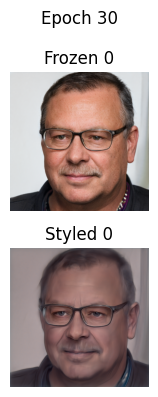

--------------------
girl: 55.81%
[31/60] Loss: 0.0193 | CLIP: 0.9233 | L2: 0.0336
--------------------
woman: 64.79%
[32/60] Loss: 0.0196 | CLIP: 0.8652 | L2: 0.1848
--------------------
man: 50.29%
[33/60] Loss: 0.0159 | CLIP: 0.8145 | L2: 0.0695
--------------------
man: 43.31%
[34/60] Loss: 0.0175 | CLIP: 0.8516 | L2: 0.2020
--------------------
woman: 70.90%
[35/60] Loss: 0.0144 | CLIP: 0.7998 | L2: 0.0903
--------------------
man: 66.99%
[36/60] Loss: 0.0151 | CLIP: 0.8989 | L2: 0.0742
--------------------
girl: 63.82%
[37/60] Loss: 0.0144 | CLIP: 0.8926 | L2: 0.0737
--------------------
man: 41.16%
[38/60] Loss: 0.0138 | CLIP: 0.8730 | L2: 0.0984
--------------------
girl: 54.10%
[39/60] Loss: 0.0127 | CLIP: 0.7930 | L2: 0.1716
--------------------
woman: 81.10%
[40/60] Loss: 0.0134 | CLIP: 0.8711 | L2: 0.1824


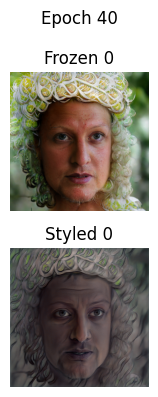

--------------------
baby: 79.59%
[41/60] Loss: 0.0117 | CLIP: 0.8018 | L2: 0.1459
--------------------
woman: 89.40%
[42/60] Loss: 0.0127 | CLIP: 0.8813 | L2: 0.1975
--------------------
man: 46.63%
[43/60] Loss: 0.0120 | CLIP: 0.8984 | L2: 0.1216
--------------------
woman: 70.21%
[44/60] Loss: 0.0119 | CLIP: 0.8740 | L2: 0.2114
--------------------
woman: 86.96%
[45/60] Loss: 0.0108 | CLIP: 0.8638 | L2: 0.1163
--------------------
man: 58.59%
[46/60] Loss: 0.0102 | CLIP: 0.8457 | L2: 0.0867
--------------------
man: 51.42%
[47/60] Loss: 0.0112 | CLIP: 0.9360 | L2: 0.1394
--------------------
man: 65.48%
[48/60] Loss: 0.0112 | CLIP: 0.9326 | L2: 0.2039
--------------------
woman: 94.19%
[49/60] Loss: 0.0102 | CLIP: 0.8994 | L2: 0.1312
--------------------
girl: 84.47%
[50/60] Loss: 0.0092 | CLIP: 0.8369 | L2: 0.1164


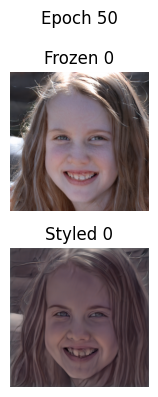

--------------------
woman: 37.01%
[51/60] Loss: 0.0098 | CLIP: 0.8682 | L2: 0.2366
--------------------
girl: 71.44%
[52/60] Loss: 0.0096 | CLIP: 0.8320 | L2: 0.3423
--------------------
girl: 38.40%
[53/60] Loss: 0.0091 | CLIP: 0.8633 | L2: 0.1655
--------------------
woman: 70.85%
[54/60] Loss: 0.0090 | CLIP: 0.8916 | L2: 0.1088
--------------------
man: 43.99%
[55/60] Loss: 0.0091 | CLIP: 0.9087 | L2: 0.1618
--------------------
man: 14.40%
[56/60] Loss: 0.0091 | CLIP: 0.9292 | L2: 0.1599
--------------------
man: 67.77%
[57/60] Loss: 0.0087 | CLIP: 0.9141 | L2: 0.1239
--------------------
man: 54.98%
[58/60] Loss: 0.0086 | CLIP: 0.9336 | L2: 0.0767
--------------------
woman: 87.35%
[59/60] Loss: 0.0082 | CLIP: 0.8423 | L2: 0.2801
--------------------
man: 61.33%
[60/60] Loss: 0.0085 | CLIP: 0.9321 | L2: 0.1579


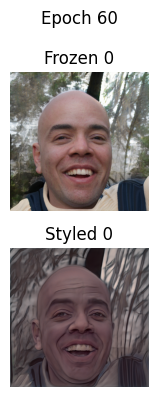

In [ ]:
# Training parameters
top_k = 10
torch.manual_seed(43)
trainer = LatentStyleTrainer(
    generator=generator,
    model_clip=model_clip,
    text_features_source=text_features_source,
    text_features_target=text_features_target,
    freeze_fn=lambda model_train, model_frozen, text, top_k: freeze_layers_adaptive(model_train, model_frozen, text, k=top_k),
    clip_directional_loss=clip_directional_loss_fn,
    clip_classifier=clip_classification,
    text_features_cat=text_features_cat,
    latent_dim=latent_dim,
    batch_size=1,
    device=device,
    lr_generator=0.008,
    lr_lambda=0.2,
    weight_decay=0.003,
    lambda_clip_init=1.0,
    lambda_l2_init=1.0,
    scheduler_step_size=40,
    scheduler_gamma=0.3
)
# Training
epochs_to_train = 60
trainer.train(epochs=epochs_to_train, freeze_each_epoch=True, reclassify=True)

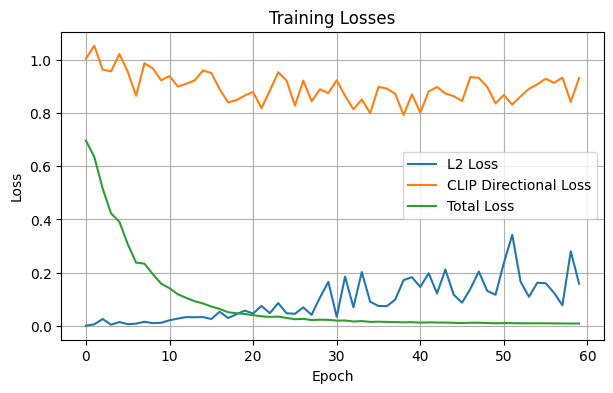

In [ ]:
# Plotting losses
trainer.plot_losses()

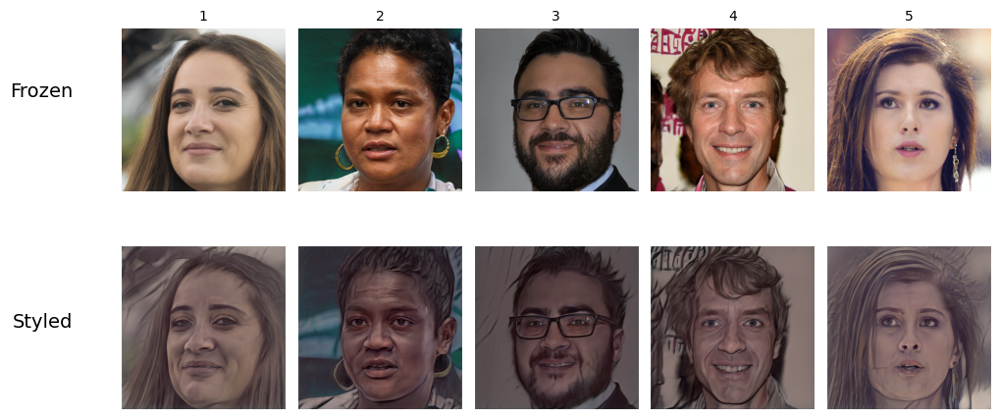

Saved styled images to: ../validation_outputs/clip_classification/sketch


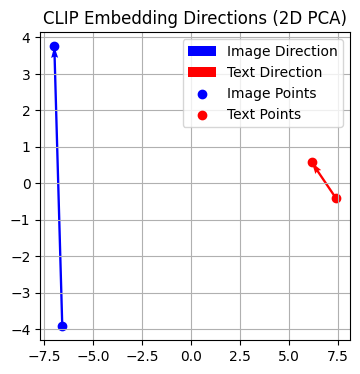

In [ ]:
# Generating test images
generate_visualize_and_save(trainer, seeds, output_dir="../validation_outputs/clip_classification", folder_name=target_class)

# Visualizing style direction
latent_w = trainer.sample_latent_w(seed=seeds[0])
image_frozen, _ = trainer.model["generator_frozen"]([latent_w], input_is_latent=True, randomize_noise=False)
image_styled, _ = trainer.model["generator_train"]([latent_w], input_is_latent=True, randomize_noise=False)
img = (image_frozen[0].detach().cpu().clamp(-1, 1) + 1) / 2
img_pil = Image.fromarray((img.permute(1, 2, 0).numpy() * 255).astype(np.uint8))

text_forzen_clip = clip_classification(img_pil, text_features_cat, False)
text_target_clip = clip.tokenize([text_forzen_clip]).to(device)
trainer.visualize_clip_directions(image_frozen=image_frozen, image_styled=image_styled, text_target=text_target_clip, text_source=text_source, preprocess=preprocess)

##Results analysis
We can compare:
- Images before stylization
- Images after stylization
- CLIP embedding directions
